# Praca domowa 1 - eksploracja zbioru danych
### Mateusz Krzyziński, grupa 2

Celem tej pracy domowej jest przeprowadzenie eksploracji zadanego [zbioru danych](https://www.apispreadsheets.com/datasets/129). Dotyczy on pożarów lasów w parku przyrodu Montesinho w północno-wschodniej Portugalii. Dane pochodzą z roku 2007 z publikacji pt. [*A Data Mining Approach to Predict Forest Fires using Meteorological Data*](http://www3.dsi.uminho.pt/pcortez/fires.pdf), a dotyczą lat 2000-2003. W tejże pracy możemy znaleźć między innymi mapkę parku, którego dotyczą dane wraz z podziałem jego obszaru na segmenty. <img src="park-map.png" alt="Map" style="width: 600px;"/>

In [1]:
# Import pakietów
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wstępne spojrzenie i zapoznanie się ze zbiorem

In [2]:
# Wczytanie danych
fires_df = pd.read_csv("https://lovespreadsheet-tutorials.s3.amazonaws.com/APIDatasets/forest_fires_dataset.csv")

In [3]:
fires_df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


Na pierwszy rzut oka zbiorek wygląda w porządku - nie widzimy żadnych `NaN`ów, brakujących wartości czy czegoś, co mogłoby nas mocno zdziwić (może oprócz zerowej powierzchni `area` - później się temu przyjrzymy).

Teraz wykorzystajmy bazowe narzędzia i zbadajmy dokładniej zbiorek. 

In [4]:
fires_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


Okazuje się, że rzeczywiście nie mamy żadnych `NaN`ów w całym zbiorze, ma on 517 wierszy i 13 kolumn, spośród których znaczna część (11) ma wartości liczbowe. Pozostałe dwie kolumny też możemy zamienić na liczbowe - dotyczą one dnia tygodnia i miesiąca odnotowanego pożaru. 

Część kolumn ma jednak zdecydowanie enigmatyczne nazwy, dlatego należy sprawdzić, co one oznaczają. W tym celu skorzystamy z dołączonego do zbioru pliku z opisem poszczególnych kolumn. 

In [5]:
attributes = pd.read_csv("attributes_forest_fires.csv")
pd.set_option('max_colwidth', 800)
attributes

,name,type,description
0,X,integer,x-axis spatial coordinate within the Montesinho park map: 1 to 9
1,Y,integer,y-axis spatial coordinate within the Montesinho park map: 2 to 9
2,month,string,month of the year: 'jan' to 'dec'
3,day,string,day of the week: 'mon' to 'sun'
4,FFMC,float,FFMC index from the FWI system: 18.7 to 96.20
5,DMC,float,DMC index from the FWI system: 1.1 to 291.3
6,DC,float,DC index from the FWI system: 7.9 to 860.6
7,ISI,float,ISI index from the FWI system: 0.0 to 56.10
8,temp,float,temperature in Celsius degrees: 2.2 to 33.30
9,RH,float,relative humidity in %: 15.0 to 100


X i Y to koordynaty obszarów, które zilustrowane są na załączonej na górze mapce.

Wciąż nie wiemy wszystkiego, ale po wiedzę, czym jest system FWI i jego składowe możemy zajrzeć do Internetu albo wprost do wspomnianej wyżej pracy lub też do polskojęzycznej pracy o podobnej tematyce - [tutaj](http://yadda.icm.edu.pl/yadda/element/bwmeta1.element.baztech-42c52651-489b-45e6-8835-e34883191bde/c/wozniak_okreslanie_52_2014.pdf). 

**FWI** to Fire Weather Index i jest systemem/standardem do oceny zagrożenia pożarowego. Wsród jego składowych wyróżnia się: 
- FFMC - Fine Fuel Moisture Code - oznacza wilgotność górnej warstwy dna lasu - ściółki leśnej, wskaźnik zapalności, najbardziej zmienna składowa;
- DMC - Duff Moisture Code - oznacza wilgotność śrendiej warstwy dna lasu, ma większy czas opóźnienia; również czym większa wartość indeksu, tym niższa wilgotność materiału palnego i wyższy stopeiń zagrożenia; 
- DC -  Drought Code - oznacza wilgotność dolnej warstwy dna lasu, najwolniej zmieniający się składnik;
- ISI - Initial Spread Index - to wskaźnik początkowej, spodziewanej prędkości propagacji (rozprzestrzeniania się) ognia.

To też dobry moment, żeby sprawdzić, dlaczego w ramce danych z pożarami są pożary, które mają powierchnię 0 ha. Z pracy dowiadujemy się, że te wiersze oznaczają pożary, których powierzchnia była mniejsza niż $\frac{1}{100}$ ha, czyli 100 m$^2$. 

Teraz mamy już jakąś szerszą wiedzę i możemy zacząć przyglądać się samym danym...

### Podstawowe wielkości opisujące dane

In [6]:
fires_df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


Już tutaj możemy zauważyć, że w kolumnach `FFMC`, `ISI` czy `area` są outliery - obserwacje krańcowe znacząco różnią się od kwartyli. Ponadto w opisie zbioru znajdujemy informacje, że zalecana jest transformacja kolumny `area` ze względu na bardzo dużą skośność. Można to zrobić wykorzystując funkcję $y=log(1+x)$.
Przyjrzyjmy się jednak rozkładom wszystkich zmiennych, może się okazać, że jeszcze któreś wymagałyby transformacji w celu wytrenowania lepszego modelu. 

### Rozkłady zmiennych

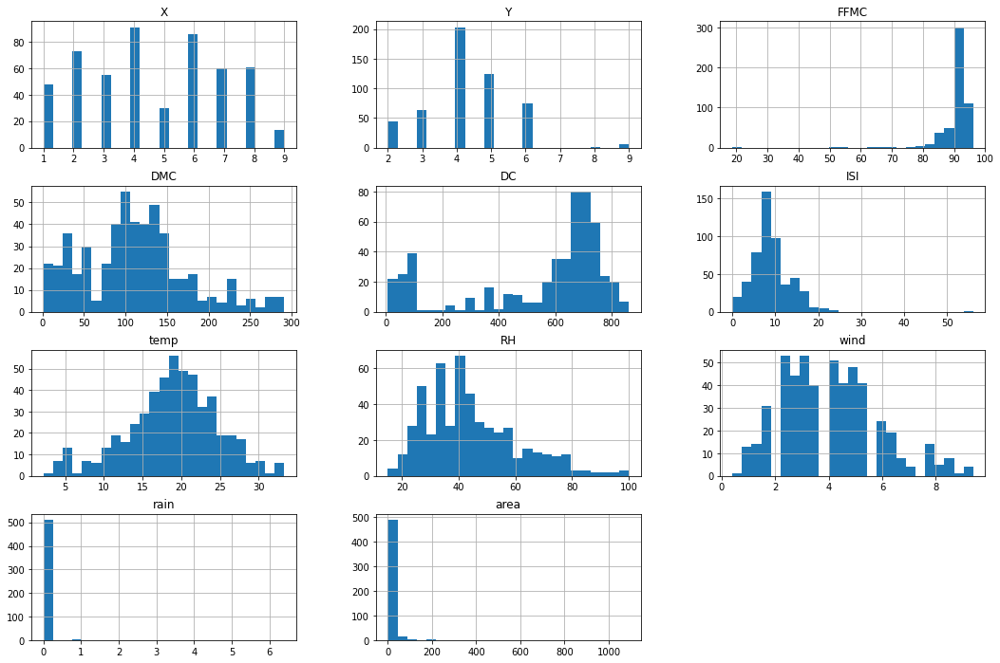

In [7]:
fires_df.hist(bins = 25, figsize=(18, 12))
plt.show()

Co widzimy? 
Rozkład temperatury `temp` przypomina normalny, czego moglibyśmy się nawet spodziewać. 
Wilgotność powietrza `RH`, prędkość wiatru `wind` i parametry pochodzące z Fire Weather Indexu: `DMC`, `DC`, `ISI` również wydają się mieć *odpowiednie* rozkłady. 
Wspominaliśmy już o konieczności zlogarytmowania powierzchni `area`, natomiast można by się zastanowić nad transformacją również parametru `FFMC` i opadów deszczu `rain`.

Przyjrzyjmy się jednak bliżej opadom deszczu...

In [8]:
fires_df["rain"].value_counts()

0.0    509
0.8      2
0.2      2
0.4      1
1.4      1
6.4      1
1.0      1
Name: rain, dtype: int64

Okazuje się, że aż 509 rekordów jest powiązanych z dniami, gdzie nie padał deszcz, a tylko 8 dni to takie, gdzie występowały opady. Zatem wydaje się, że nie ma sensu transformacja w tym przypadku.

Spójrzmy jak istotnie różne są histogramy zmiennej `area` przed i po transformacji, o której wspomnieliśmy. Jako że nie będziemy trenować modelu, nie transformuję na stałe tejże zmiennej. 

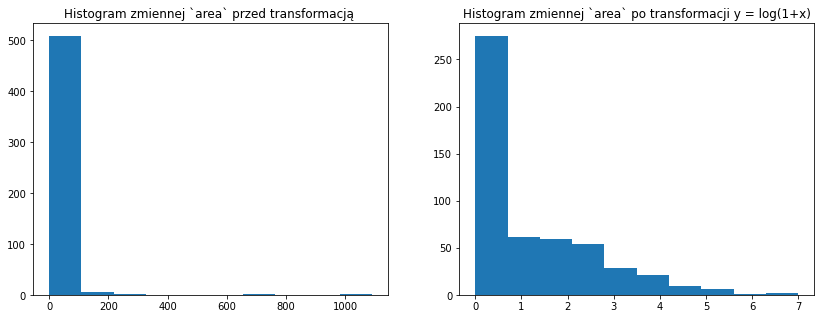

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))
axes[0].hist(fires_df["area"])
axes[0].set_title("Histogram zmiennej `area` przed transformacją ")
axes[1].hist(np.log1p(fires_df["area"]))
axes[1].set_title("Histogram zmiennej `area` po transformacji y = log(1+x)")
plt.show()

### Korelacje i zależności 

Mamy wiele zmiennych liczbowych, popatrzmy więc najpierw na macierz korelacji między nimi. 

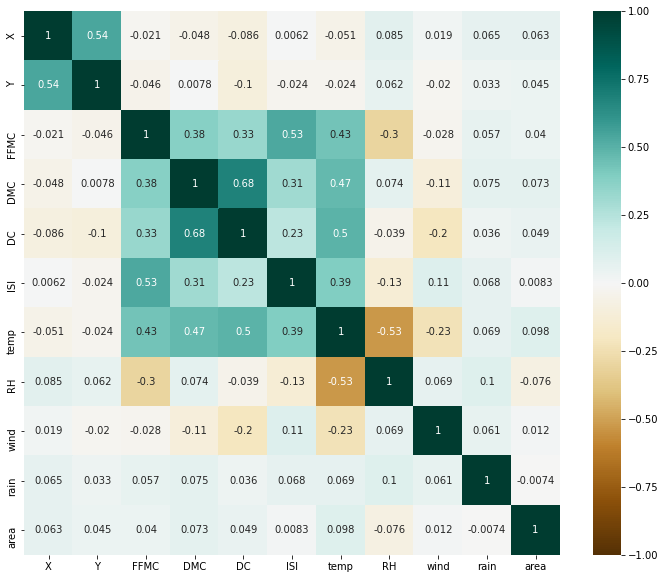

In [10]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(fires_df.corr(), annot=True, vmin=-1, vmax=1, cmap="BrBG")
plt.show()

Widzimy korelacje pomiędzy składowymi Fire Weather Indexu i temperaturą oraz wilgotnością powietrza. 
Oczywiście poszczególne parametry korelują ze sobą, gdyż są powiązane z wilgotnością kolejnych poziomów gleby oraz szybkością rozprzestrzeniania się pożarów. Korelacje z temperaturą i wilgotnością (w przypadku `FFMC`) wynikają natomiast z wzorów na te parametry. Także intuicyjnie jesteśmy w stanie stwierdzić, że wilgotność powietrza może mieć wpływ na wilgotność ściółki leśnej. 
Te obserwacje trzeba mieć na uwadze przy późniejszym wyborze parametrów do trenowania modelu. 


Natomiast możemy zauważyć, że sama zmienna mająca być zmienną wyjaśnianą - `area` nie jest silnie skorelowana z żadną inną zmienną.

Dla pełniejszego obrazu sytuacji w kwestii zależności spójrzmy na wykresy zależności zmiennych ciągłych.

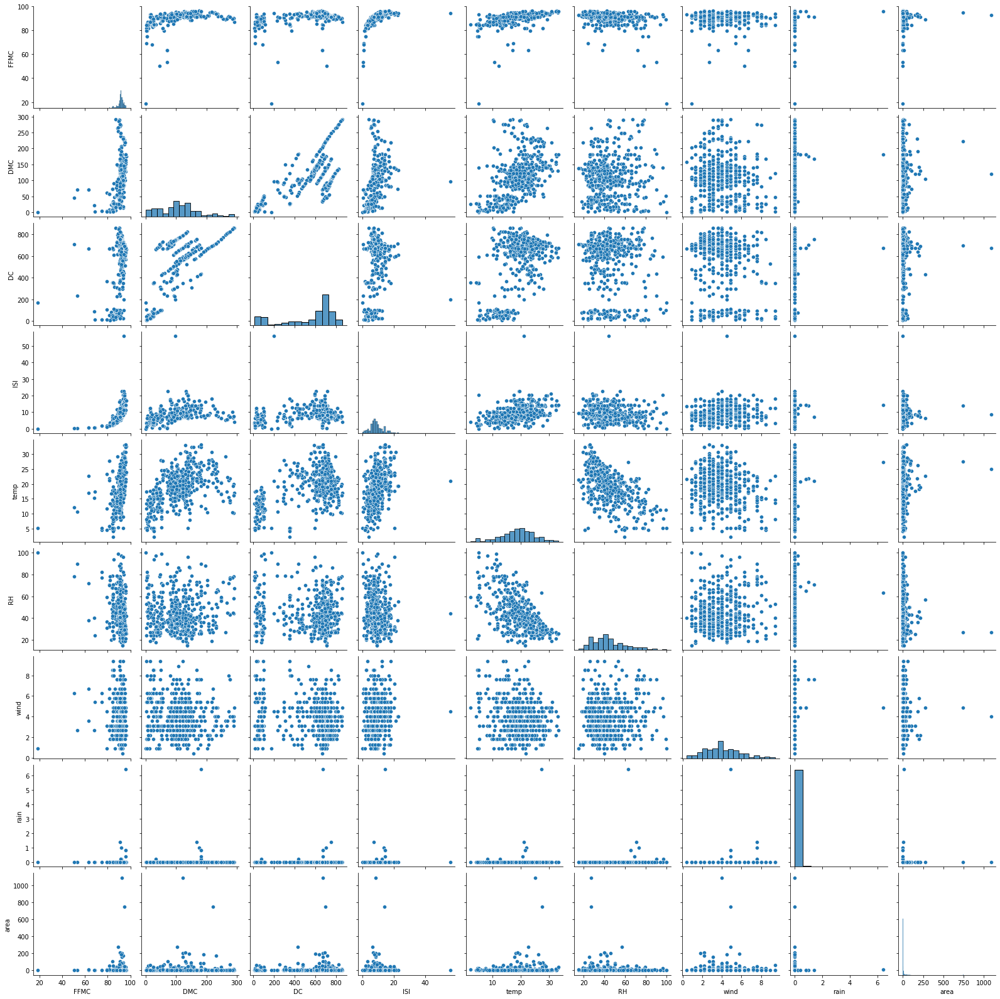

In [11]:
sns.pairplot(fires_df.drop(["X", "Y"], axis=1))
plt.show()

Możemy zauważyć, że korelacje o których wspomnieliśmy już wyżej są widoczne. Ponadto możemy powiedzieć więcej - zależność FFMC od ISI wydaje się mieć charakter logarytmiczny, a DMC od DC liniowy. Podobnie zachowuje się temperatura względem wilgotności powietrza.

Wybiegając w przyszłość i myśląc o modelu, sprawdźmy również jak wyglądają zależności pomiędzy transformowaną zmienną celu - `area` a pozostałymi zmiennymi.

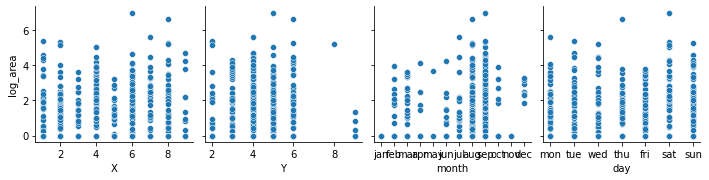

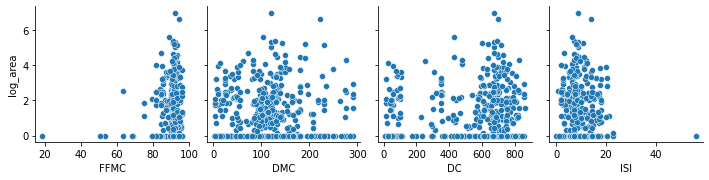

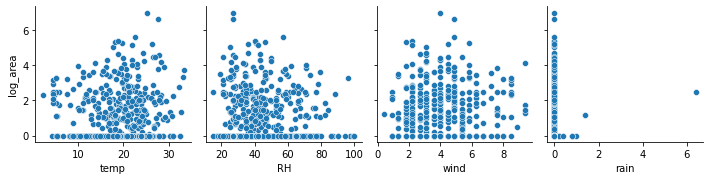

In [12]:
months_ordered = ["jan", "feb", "mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]
days_ordered = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]
fires_df['month'] = pd.Categorical(fires_df['month'], ordered=True, categories=months_ordered)
fires_df['day'] = pd.Categorical(fires_df['day'], ordered=True, categories=days_ordered)
fires_df_transformed = fires_df.copy()
fires_df_transformed["log_area"] = np.log1p(fires_df_transformed["area"])
ax1 = sns.pairplot(fires_df_transformed, y_vars="log_area", x_vars=fires_df_transformed.columns.values[:4], diag_kind = None)
ax2 = sns.pairplot(fires_df_transformed, y_vars="log_area", x_vars=fires_df_transformed.columns.values[4:8], diag_kind = None)
ax3 = sns.pairplot(fires_df_transformed, y_vars="log_area", x_vars=fires_df_transformed.columns.values[8:12], diag_kind = None)
plt.show()

Moim zdaniem nie widać prostych zależności, możemy tylko odnotować pewne obserwacje i zilustrować je lepiej - np. rozkład pożarów (ich wielkości i liczby) w ciągu roku. 

### Wybrane zależności i wykresy

Zacznijmy więc od sprawdzenia, kiedy pojawia się najwięcej pożarów. 

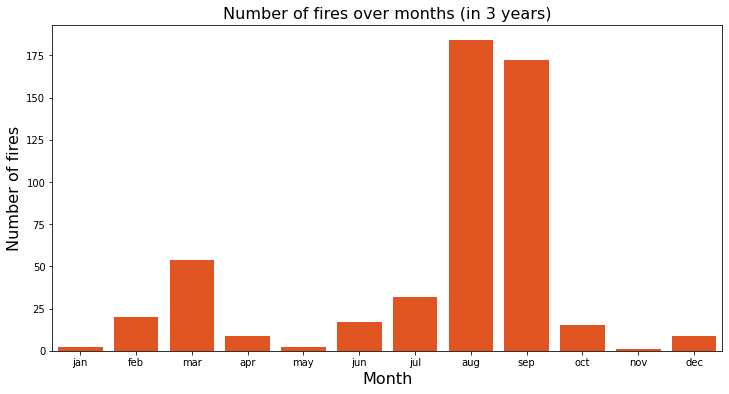

In [13]:
plt.figure(figsize=(12,6))
sns.countplot(data=fires_df, x="month", color="orangered")
plt.title("Number of fires over months (in 3 years)", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.ylabel("Number of fires", fontsize=16)
plt.show()

Najwięcej pożarów ma miejsce w sierpniu i wrześniu.

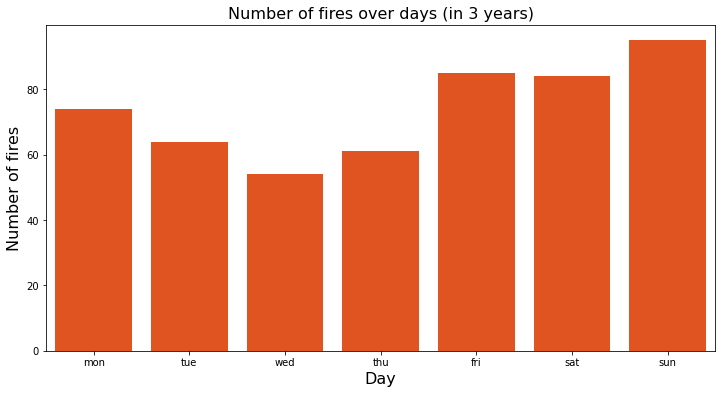

In [14]:
plt.figure(figsize=(12,6))
sns.countplot(data=fires_df, x="day", color="orangered")
plt.title("Number of fires over days (in 3 years)", fontsize=16)
plt.xlabel("Day", fontsize=16)
plt.ylabel("Number of fires", fontsize=16)
plt.show()

Najwięcej pożarów ma miejsce w weekendy, co może mieć związek z czynnikiem ludzkim. 

Sprawdźmy, w których fragmentach parku pożary występują najczęściej. 

In [15]:
fires_map = fires_df.groupby(["X", "Y"]).size().reset_index(name='count')
fires_map = fires_map.pivot_table(index="Y", columns="X", values="count", fill_value=0)

In [16]:
#Dodajemy wiersz ze współrzędnymi Y=1 i Y=7, gdzie nie występowały pożary (tylko niewielka cześc parku tam sięga)
fires_map.loc[1] = [0] * 9 
fires_map.loc[7] = [0] * 9 
fires_map.sort_index(inplace=True)

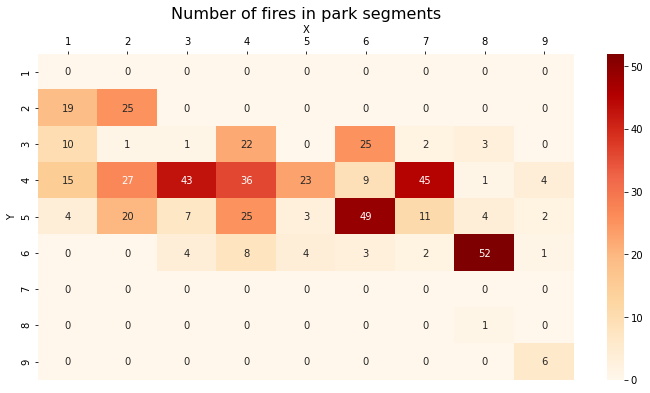

In [17]:
plt.figure(figsize=(12,6))
ax = sns.heatmap(fires_map, cmap="OrRd", annot=True)
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")
plt.title("Number of fires in park segments", fontsize=16)
plt.show()

Spróbujmy teraz nałożyć tę heatmapę na właściwą mapę parku.

In [18]:
import matplotlib.image as mpimg 
map_img = mpimg.imread('park-map.png') 

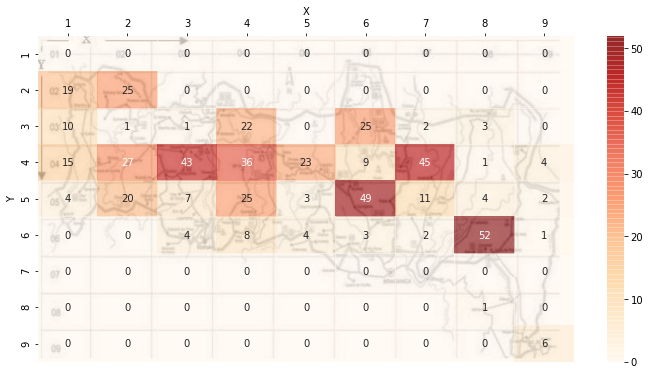

In [19]:
plt.figure(figsize=(12,6))
ax = sns.heatmap(fires_map, cmap="OrRd", annot=True, zorder=2, alpha=0.6)
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")

ax.imshow(map_img,
          aspect = ax.get_aspect(),
          extent = ax.get_xlim() + ax.get_ylim(),
          zorder = 1)
plt.show()

Podobną heatmapę możemy przygotować z medianą powierzchni pożarów w danych segmentach parku.

In [20]:
fires_map_2 = fires_df.groupby(["X", "Y"])["area"].mean().reset_index()
fires_map_2 = fires_map_2.pivot_table(index="Y", columns="X", values="area", fill_value=0)
#Dodajemy wiersz ze współrzędnymi Y=1 i Y=7, gdzie nie występowały pożary (tylko niewielka cześc parku tam sięga)
fires_map_2.loc[1] = [0] * 9 
fires_map_2.loc[7] = [0] * 9 
fires_map_2.sort_index(inplace=True)

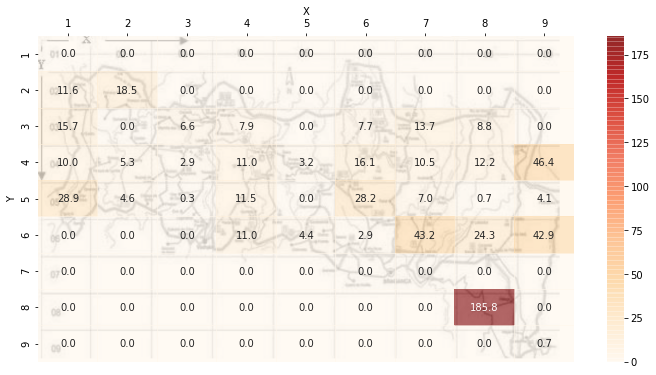

In [21]:
plt.figure(figsize=(12,6))
ax = sns.heatmap(fires_map_2, cmap="OrRd", annot=True, zorder=2, alpha=0.6, fmt=".1f")
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")

ax.imshow(map_img,
          aspect = ax.get_aspect(),
          extent = ax.get_xlim() + ax.get_ylim(),
          zorder = 1)
plt.show()

Segment o tak dużej średniej powierzchni pożarów jest segmentem, gdzie miał miejsce tylko jeden pożar, co możemy zauważyć porównując dwie mapki. Z ich porównania wynika też, że obszarem najbardziej zagrożonym wydaje się wschodnia część parku (o ile mapa jest zorientowana na północ). 

### Automatyczna eksploracja danych 

Zgodnie z wymaganiami dotyczącymi zadania mieliśmy wykorzystać również jeden z gotowych narzędzi do automatycznej eksploracji danych. W swojej pracy domowej użyję `pandas_profiling`. 

In [22]:
from pandas_profiling import ProfileReport

In [23]:
report = ProfileReport(fires_df, title="Forest Fires Dataset Profiling Report")

In [24]:
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Wynikiem jest automatycznie wygenerowany raport dotyczący zbioru danych. Zawarta jest w nim znaczna część obserwacji, o których wspominaliśmy wyżej w notatniku, chociażby wstępne `overview` daje nam informacje o kształcie ramki danych, brakujących wartościach i typach kolumn. Dostajemy też ostrzeżenie o znaczącej ilości zerowych wartości w kolumnach `rain` i `area`. Dodatkowo dowiadujemy się, że 4 wiersze w ramce są zduplikowane. 

Ponadto otrzymujemy informacje dotyczące każdej zmiennej - kolumny, z których część jesteśmy w stanie uzyskać także samodzielnie używając metody `describe` ramki danych. Natomiast więcej dowiedzieć możemy się wyświetlając szczegóły, gdzie znajdziemy także więcej parametrów statystycznych dotyczących zmiennych, histogram, najpopularniejsze wartości i najbardziej ekstremalne. 

Dalej otrzymujemy możliwość wygenerowania wykresów zależności między kolejnymi zmiennymi liczbowymi oraz macierzy korelacji różnego typu. Oprócz tego wyświetlane są również informacje o brakujących danych i wycinek z ramki danych.

Wykorzystane narzędzie daje nam więc wiele możliwości i znacznie usprawia proces wstępnej analizy danych - otrzymaliśmy większość rezultatów, do których musieliśmy dochodzić krok po kroku. 

Jednak należy zauważyć również jego **ograniczenia i wady**. Pierwszą zauważalną jest czas działania - raport generuje się dość długo, nawet dla tak niewielkiej ramki danych. Raport ma też jednoznacznie określoną strukturę, nie jesteśmy w stanie go dostosowywać do swoich potrzeb (taką potrzebą mogłaby być np. transformacja kolumny `area`). Co więcej, nie jesteśmy w stanie generować bardziej złożonych wykresów zależności czy bardziej złożonych analiz. 

Jest to zatem dobre narzędzie, które może zastąpić nas w wielu kwestiach, ale nie można polegać tylko na nim. 

In [25]:
#Raport można zapisać do pliku HTML
report.to_file(output_file='pandas_profiling_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]